In [ ]:
import numpy as np
from os.path import abspath, expanduser
from ECOv002_CMR import ECOSTRESS_CMR_search, download_file, GranuleID, download_ECOSTRESS_granule
from ECOv002_granules import ET_COLORMAP
from STIC_JPL import STIC_JPL

In [2]:
import logging

logging.getLogger().handlers = []

In [3]:
aquisition_date = "2024-10-22"
orbit = 35698
scene = 14
tile = "11SPS"
ECOSTRESS_download_directory = abspath(expanduser("~/data/ECOSTRESS"))
static_directory = abspath(expanduser("~/data/JET_static"))
working_directory = abspath(expanduser("~/data/STIC_demo"))

In [4]:
L2T_LSTE_granule = download_ECOSTRESS_granule(
    product="L2T_LSTE", 
    orbit=orbit,
    scene=scene,
    tile=tile, 
    aquisition_date=aquisition_date,
    parent_directory=ECOSTRESS_download_directory
)

L2T_LSTE_granule

L2TLSTE("/Users/gregoryhalverson/data/ECOSTRESS/ECOv002_L2T_LSTE_35698_014_11SPS_20241022T183627_0713_01")

In [5]:
hour_of_day = L2T_LSTE_granule.hour_of_day
hour_of_day

10.916666666666666

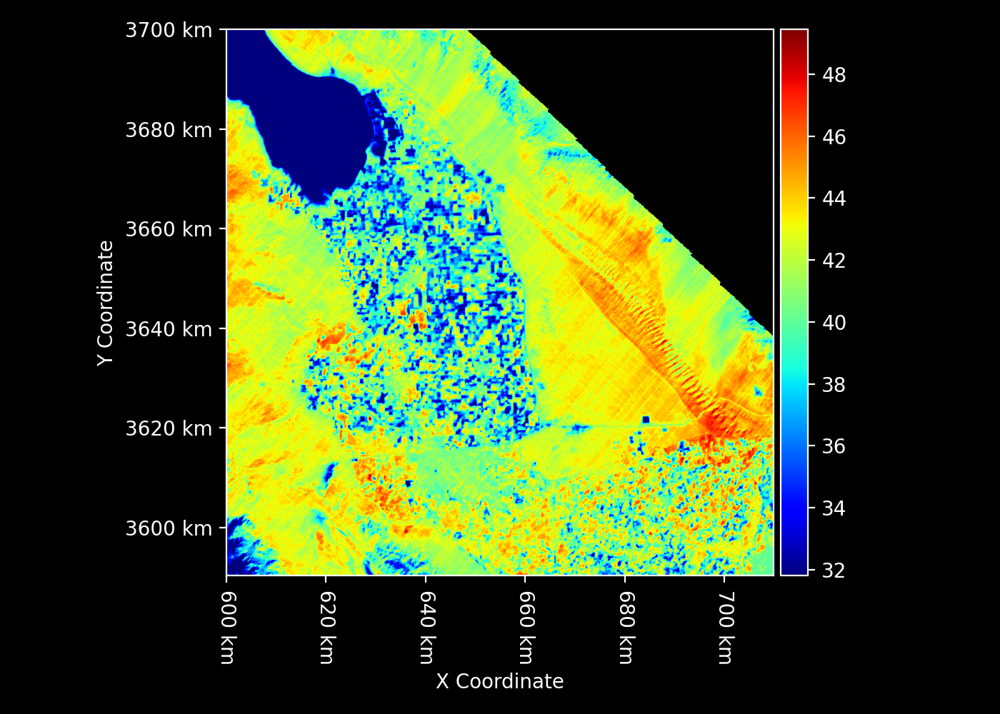

In [6]:
ST_C = L2T_LSTE_granule.ST_C
ST_C

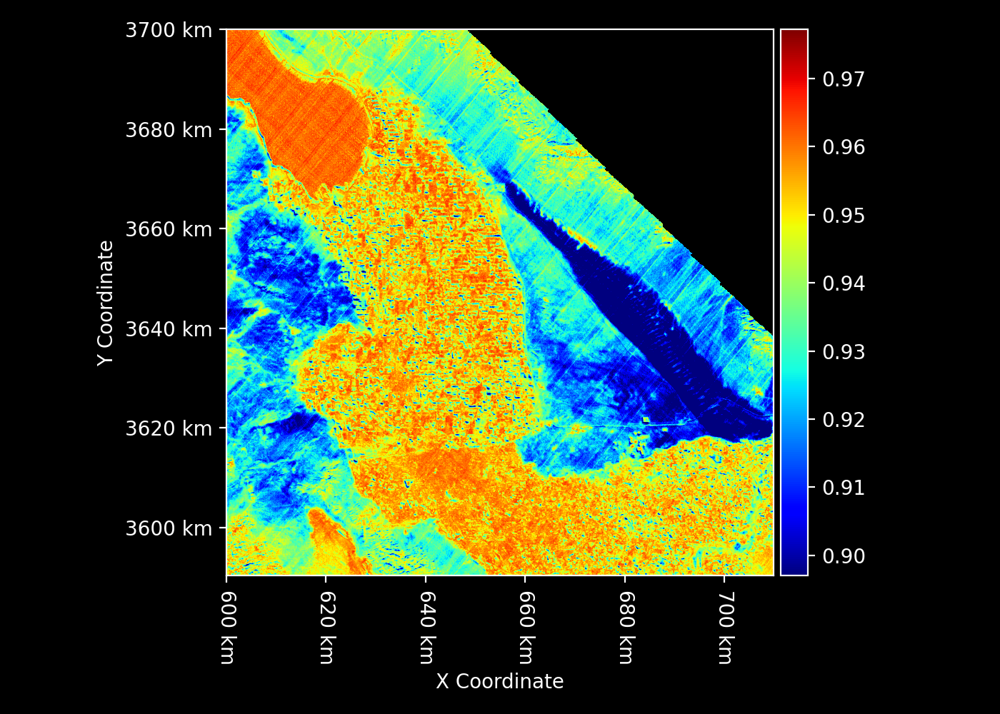

In [7]:
emissivity = L2T_LSTE_granule.EmisWB
emissivity

In [8]:
L2T_STARS_granule = download_ECOSTRESS_granule(
    product="L2T_STARS", 
    tile=tile, 
    aquisition_date=aquisition_date,
    parent_directory=ECOSTRESS_download_directory
)

L2T_STARS_granule

L2TSTARS("/Users/gregoryhalverson/data/ECOSTRESS/ECOv002_L2T_STARS_11SPS_20241022_0713_01")

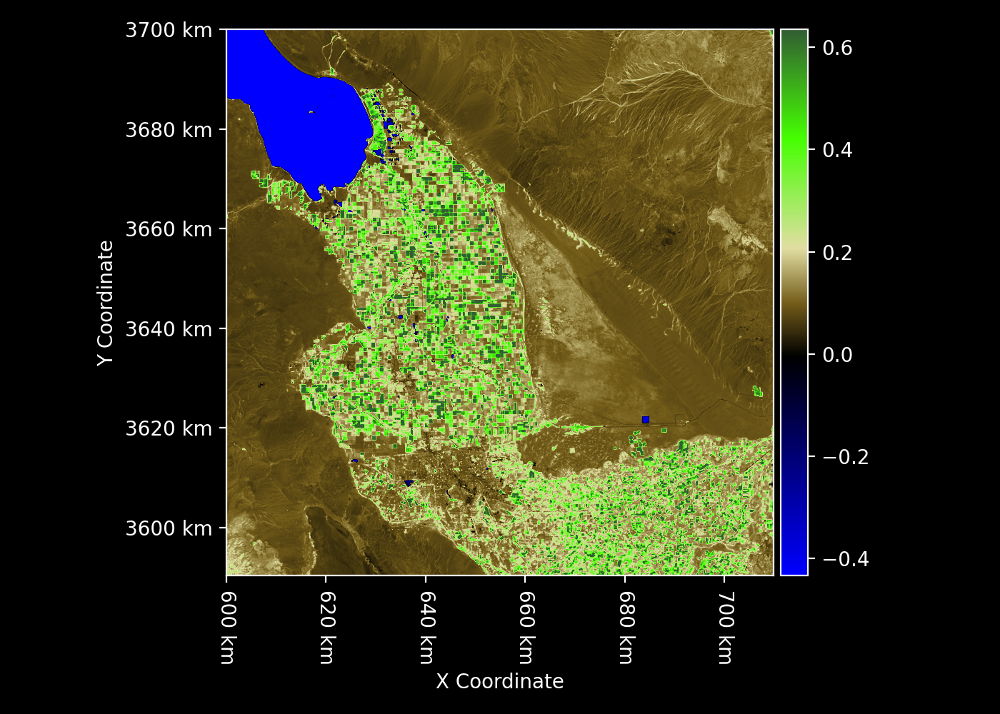

In [9]:
NDVI = L2T_STARS_granule.NDVI
NDVI

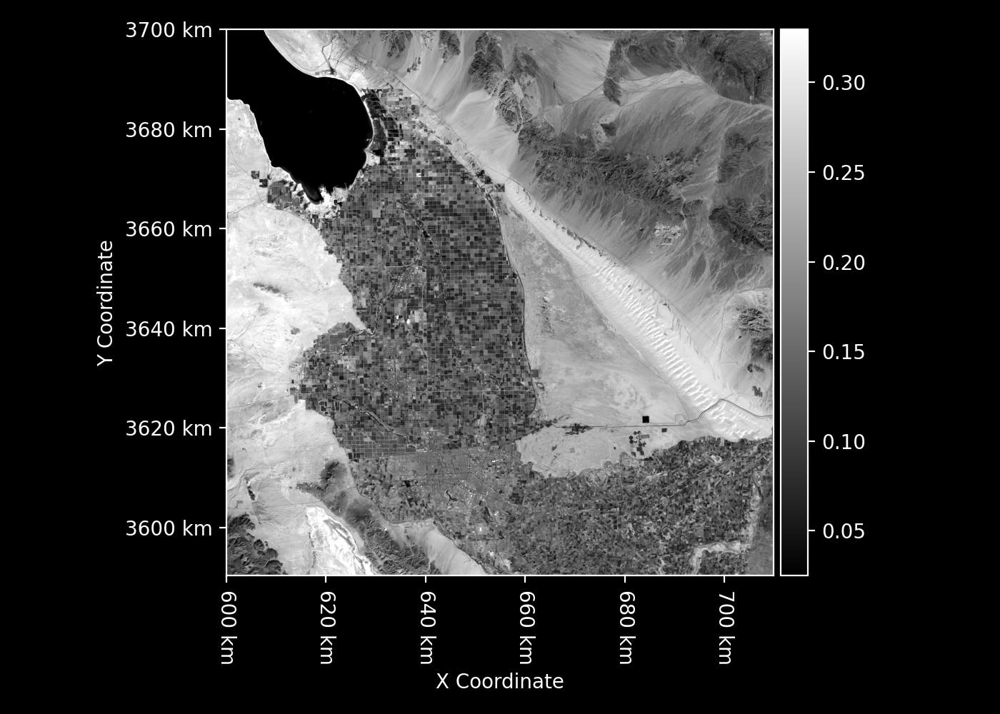

In [10]:
albedo = L2T_STARS_granule.albedo
albedo

In [11]:
L3T_SEB_granule = download_ECOSTRESS_granule(
    product="L3T_SEB", 
    orbit=orbit,
    scene=scene,
    tile=tile, 
    aquisition_date=aquisition_date,
    parent_directory=ECOSTRESS_download_directory
)

L3T_SEB_granule

L3TSEB("/Users/gregoryhalverson/data/ECOSTRESS/ECOv002_L3T_SEB_35698_014_11SPS_20241022T183627_0713_01")

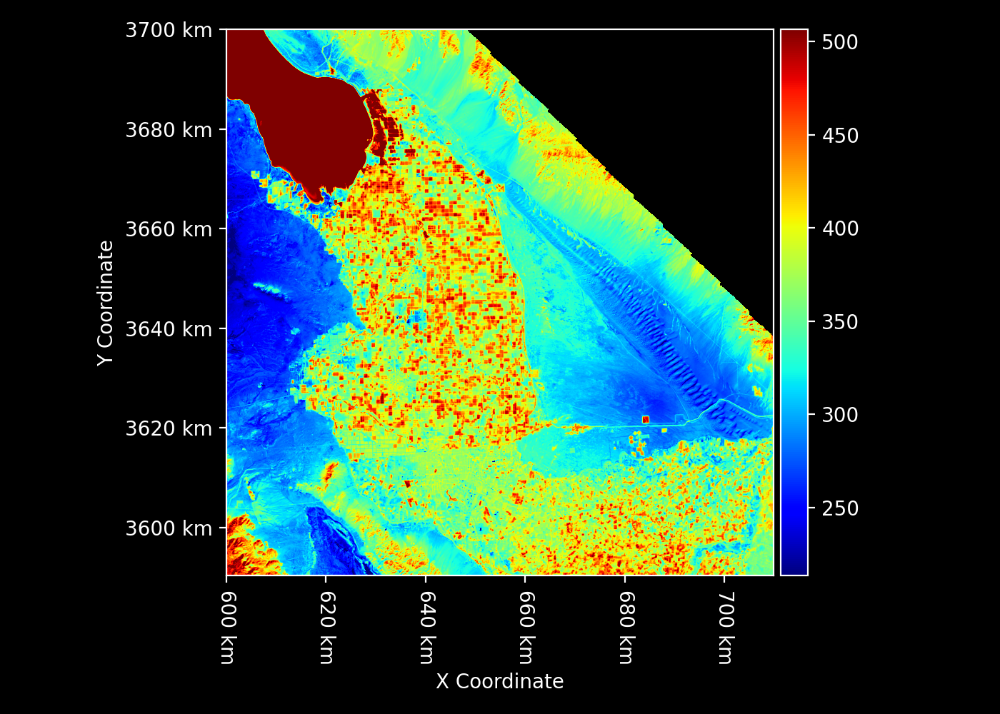

In [12]:
Rn = L3T_SEB_granule.variable("Rn")
Rn

In [13]:
L3T_MET_granule = download_ECOSTRESS_granule(
    product="L3T_MET", 
    orbit=orbit,
    scene=scene,
    tile=tile, 
    aquisition_date=aquisition_date,
    parent_directory=ECOSTRESS_download_directory
)

L3T_MET_granule

L3TMET("/Users/gregoryhalverson/data/ECOSTRESS/ECOv002_L3T_MET_35698_014_11SPS_20241022T183627_0713_01")

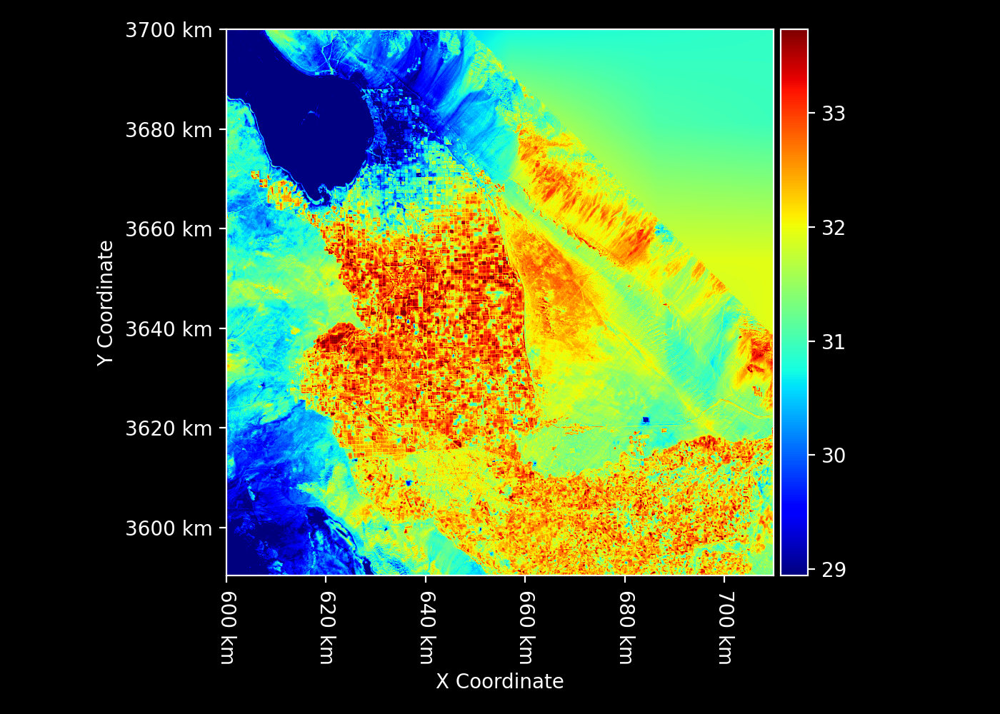

In [14]:
Ta_C = L3T_MET_granule.variable("Ta")
Ta_C

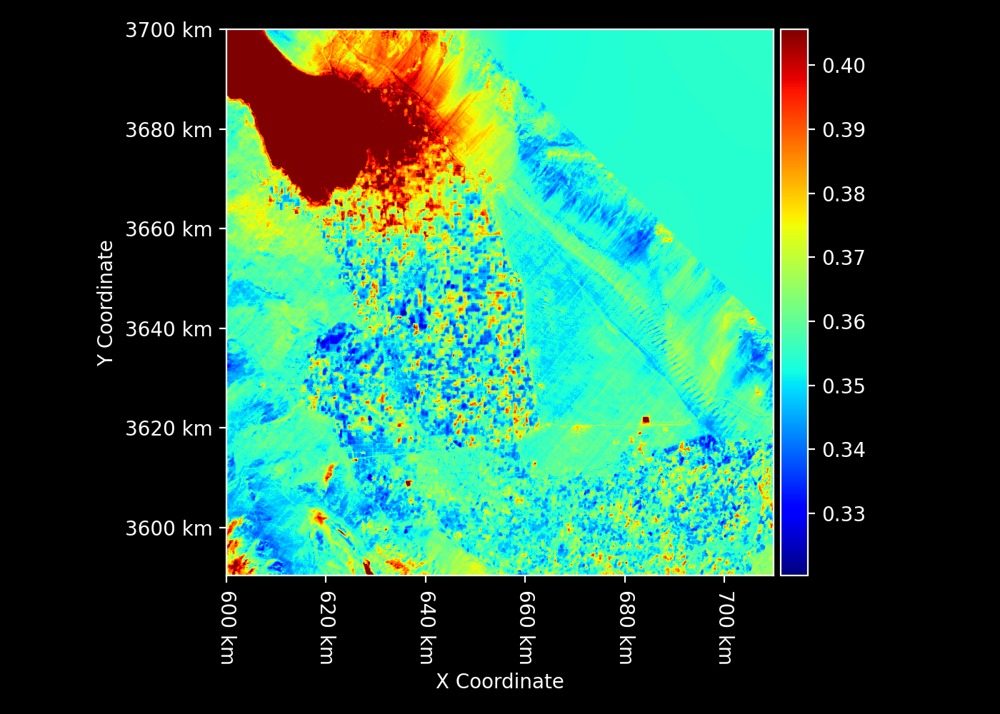

In [15]:
RH = L3T_MET_granule.variable("RH")
RH

In [ ]:
results = STIC_JPL(
    hour_of_day=hour_of_day,
    NDVI=NDVI,
    Ta_C=Ta_C,
    RH=RH,
    Rn_Wm2=Rn,
    albedo=albedo,
    ST_C=ST_C,
    emissivity=emissivity
)

/opt/homebrew/Caskroom/mambaforge/base/envs/STIC/lib/python3.11/site-packages/rasters/raster.py:1740: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


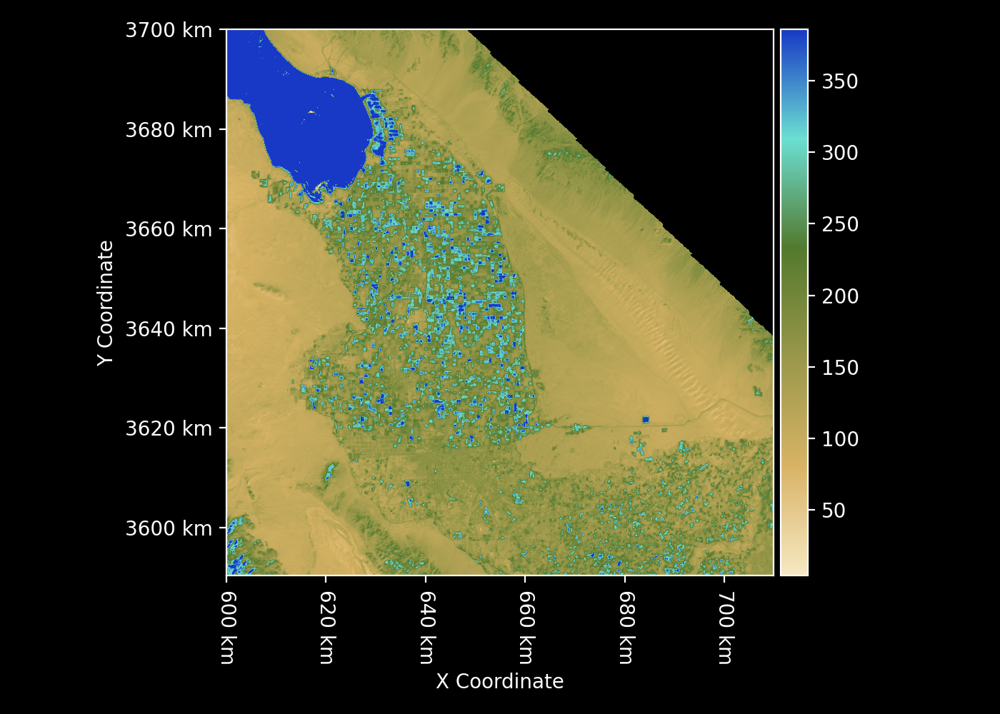

In [17]:
LE = results["LE"]
LE.cmap = ET_COLORMAP
LE.to_geotiff("example_LE.tif")
LE